# 21M.387 Fundamentals of Music Processing
## Pset5

In [13]:
import numpy as np
import matplotlib.pyplot as plt
import IPython.display as ipd
from ipywidgets import interact

import sys
sys.path.append("../common")
from util import *
import fmp
import math

%matplotlib inline
plt.rcParams['figure.figsize'] = (12, 3)

## Exercise 1

Load the audio below and create the Spectral Novelty Funciton using `fmp.spectral_novelty`
and these parameters:

$N = 1024$  
$H = 512$  
$\gamma = 100$

- Name it `nov`
- Plot it



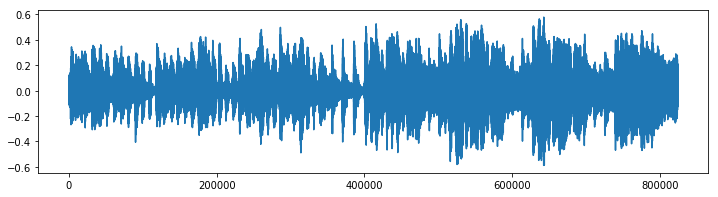

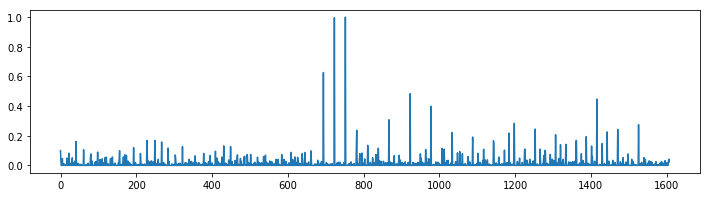

In [14]:
snd = load_wav("audio/beatles_lucy_excerpt.wav")
fs = 22050

nov_win_len, nov_hop_size, nov_gamma = 1024, 512, 100

nov = fmp.spectral_novelty(snd, nov_win_len, nov_hop_size, nov_gamma)

plt.figure()
plt.plot(snd)
plt.figure()
plt.plot(nov)

Create $\mathcal{F}(n, k)$, the tempogram from this novelty curve using the parameters:

$N_{tg} = 256$  
$H_{tg} = 16$  
$Z_{tg} = 16$  

Use `fmp.stft` with the `centered=False` option for the STFT. This will be important later on.

Plot this tempogram with `plt.imshow`.

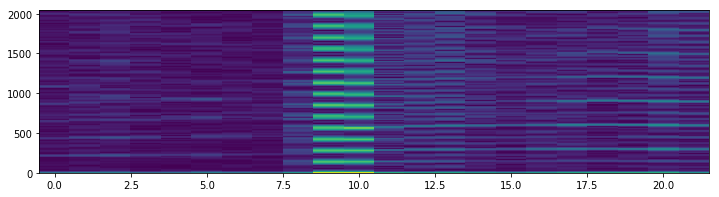

In [15]:
tg_win_len = 256
tg_hop_size = 64
tg_zero_pad = 16

tg = fmp.stft(nov, tg_win_len, tg_hop_size, tg_zero_pad, centered=False)
plt.imshow(abs(tg), origin='lower', aspect='auto');

## Exercise 2

We now have three time series:
- The original audio recording $x(n)$
- The novelty function $\Delta(n)$
- The tempogram $\mathcal{F}(n, k)$

Each has a different sampling rate. It is important to keep these in mind to avoid confusion later on.

1. What are the sampling rates for each of the above signals?
- For the tempogram $\mathcal{F}(n, k)$, what value of $k$ corresponds to 120 BPM?
- What tempo (in BPM) does $k=100$ represent?

Please answer these questions by showing your calculations in python and printing the results.

In [16]:
f_snd = fs
f_nov = fs / float(nov_hop_size)
f_tg  = f_nov / float(tg_hop_size)
p1 = [f_snd, f_nov, f_tg]
print p1

def bpm_to_k(beats_per_minute, f_nov, tg_win_len, tg_zero_pad):
    #should only need to convert from time once
    beats_per_sec = beats_per_minute / 60.0
    beats_per_tg_sample = beats_per_sec / float(f_nov)
    beats_per_tg_window = beats_per_tg_sample * (tg_win_len * tg_zero_pad) 
    k = beats_per_tg_window #sin wave w/ same periodicity
    return k #periods / 1 tg window
    
p2 = bpm_to_k(120.0, f_nov, tg_win_len, tg_zero_pad)
print p2


def k_to_bpm(k, f_nov, tg_win_len, tg_zero_pad): #k = periods / 1 window
    periods_per_tg_sample = k/float(tg_win_len * tg_zero_pad)
    periods_per_sec = periods_per_tg_sample * float(f_nov)
    bp_sec = periods_per_sec #beat w/ same periodicity
    bpm = bp_sec*60
    return bpm

p3 = k_to_bpm(100, f_nov, tg_win_len, tg_zero_pad)
print p3
    

[22050, 43.06640625, 0.67291259765625]
190.217868481
63.0855560303


## Exercise 3

Write the function `best_tempogram_bins` that returns the index ($k$) of the most likely tempo for each column of a Fourier tempogram. However, instead of just returning the column-wise maximum, find the best tempo estimate from within a given tempo range.

Inputs:  
- `tg`: the tempogram
- `ff`: $F_f$, the sampling rate of $\Delta(n)$
- `bpm_low`, `bpm_high`: tempo constraints in beats-per-minute

Output:  
- a vector, same length as `tg`, where each value is the index ($k$) of the most likely tempo. 

Strategy:
- Convert the BPMs into frequency bins ($k$'s)
- Set all values of the tempogram to 0 that are below the low bpm frequency or above the high bpm frequency.
- Take the column-wise maximum.

Hint: careful not to modify the original tempogram in your function. Make a copy if you want to modify it.

In [17]:

def best_tempogram_bins(tg, f_nov, bpm_low, bpm_high):
    k_low = int(math.ceil(bpm_to_k(bpm_low, f_nov, tg_win_len, tg_zero_pad)))
    k_high = int(bpm_to_k(bpm_high, f_nov, tg_win_len, tg_zero_pad))
    tg_copy = abs(tg.copy())
    tg_copy[:k_low, :] = 0
    tg_copy[k_high:,:] = 0
    return np.argmax(tg_copy,0)
    

Now test your function with the spectral novelty you created above using a BPM range of $[30-250]$.

In a single figure:
- plot the tempogram, but only in the subrange $k = [0 - 400]$
- plot the best tempo estimates as red dots [Hint: use `'ro'`]


48
396


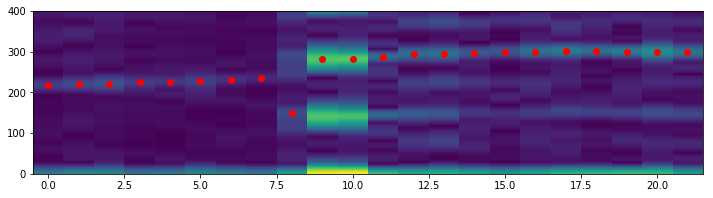

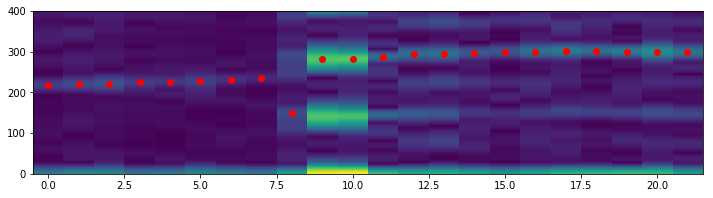

In [70]:
bpm_low, bpm_high = 30, 250
best_bins = best_tempogram_bins(tg, f_nov, bpm_low, bpm_high)
best_bins2 = fmp.best_tempogram_bins(tg, f_nov, bpm_low, bpm_high)

sample_num = np.arange(tg.shape[1])
plt.imshow(abs(tg[:401,:]), origin='lower', aspect='auto');
#plt.plot(tg[:401,:])
plt.plot(sample_num, best_bins[sample_num], 'ro')
plt.show()

plt.imshow(abs(tg[:401,:]), origin='lower', aspect='auto');
#plt.plot(tg[:401,:])
plt.plot(sample_num, best_bins2[sample_num], 'ro')
plt.show()



## Exercise 4

Using the bins from above, which represent the most likely tempo values per time slot, find the sinusoid parameters used to recreate a PLP (Predominant Local Pulse). Creating the actual PLP happens in the next Exercise.

The function `get_sinusoid_params()` below should return the set of frequencies and phases associated with the given bins of the spectrogram (ie, the tempogram).

Inputs:
- `tg`: the tempogram
- `ff`: $F_f$, the sampling rate of $\Delta(n)$
- `bins`: the tempo estimates calculated above.

Outputs:
- `(freqs, phases)`, a tuple of vectors representing the frequencies and phases at each bin.


In [67]:
def get_sinusoid_params(tg, ff, bins):
    cs = tg[bins,np.arange(tg.shape[1])]
    freqs = bins*ff/tg.shape[0] 
    phases = np.angle(cs)
    return (freqs, phases)
    

Calculate the frequencies and phases for the above tempogram using your function and plot them.

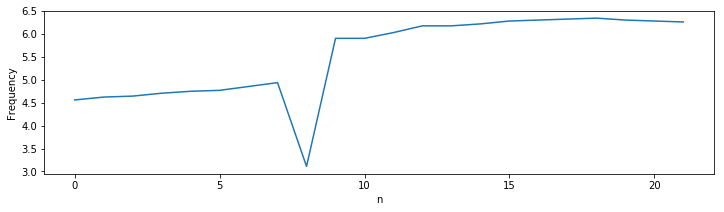

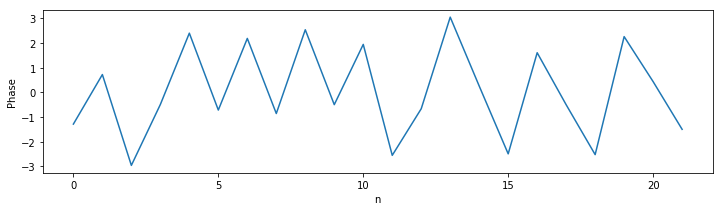

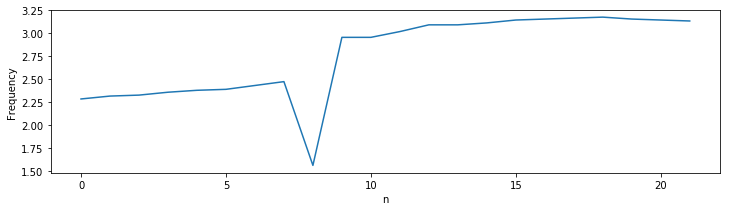

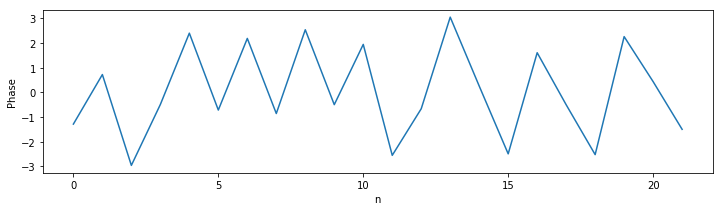

In [73]:
params = get_sinusoid_params(tg, f_nov, best_bins)
(freqs, phases) = params
freqs2, phases2 = fmp.get_sinusoid_params(tg, f_nov, best_bins)

plt.figure()
plt.plot(freqs)
plt.ylabel('Frequency')
plt.xlabel('n')
plt.figure()
plt.plot(phases)
plt.ylabel('Phase')
plt.xlabel('n');

plt.figure()
plt.plot(freqs2)
plt.ylabel('Frequency')
plt.xlabel('n')
plt.figure()
plt.plot(phases2)
plt.ylabel('Phase')
plt.xlabel('n');



## Exercise 5

The final step in creating the PLP - aka $\Gamma(n)$ - is to go through each frequency / phase pair, generate a windowed sinusoid, and then add up all these sinusoid together. The trick is to place the generated sinusoid at the proper location in time.

Write the function `make_plp()`

Inputs:
- `freqs`: frequencies from `get_sinusoid_params()` 
- `phases`: phases from `get_sinusoid_params()`
- `ff`: $F_f$, the sampling rate of $\Delta(n)$
- `win_len_tg`: $N_{tg}$, the window length used to create the tempogram from $\Delta(n)$
- `hop_tg`: $H_{tg}$, the hop size used to create the tempogram from $\Delta(n)$


Output:
- the predominant local pulse as an array, sampled at $F_f$.

Strategy:
- Create a cosine of length $N_{tg}$, sampled at $F_f$, for each input frequency/phase.
- Taper this cosine with a Hann window of the same length.
- All these windowed cosines must be shifted by the proper amount and added to form $\Gamma(n)$. [Hint, you will need to use $H_{tg}$ to help find the proper shift amount].
- As a final step, half-wave-rectify the entire PLP signal before returning it.

In [74]:
def make_plp(freqs, phases, ff, win_len_tg, hop_tg):
    #need cos signal for each of N_tg diff k vals
    num_samples_in_tg = len(freqs)
    num_samples_in_nov = (num_samples_in_tg-1)*hop_tg+win_len_tg
    n = np.arange(win_len_tg) #win_len_tg is number samples in nov per 1 sample in tg
    Gamma = np.zeros(num_samples_in_nov)
    for i in range(num_samples_in_tg):
        Gamma[i*hop_tg:i*hop_tg+win_len_tg] += np.hanning(win_len_tg)*np.cos(2*np.pi*freqs[i]*n/float(ff) + phases[i])
    Gamma[Gamma < 0] = 0
    return Gamma

- Create the PLP
- Plot $\Delta(n)$, the Novelty Function, and $\Gamma(n)$, the PLP.
- Pick all the peaks of $\Gamma(n)$ and use those values to generate clicks so you can hear the results. You can use the helper function `listen_to_clicks` below.

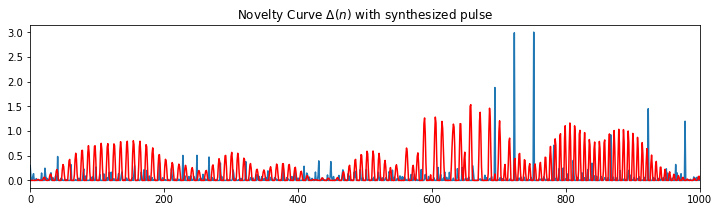

In [81]:
def listen_to_clicks(click_locations, audio) :
    '''click_locations: the samples at which to generate a click sound.
    audio: the original audio track
    returns ipd.Audio with clicks in left and audio in right channels
    '''
    click_snd = load_wav('audio/click.wav')
    clicks = fmp.make_clicks(click_locations, len(audio), click_snd)
    return ipd.Audio((clicks, audio), rate = 22050)

plp = make_plp(freqs, phases, f_nov, tg_win_len, tg_hop_size)
peaks = find_peaks(plp, thresh = 0)

plt.figure()
plt.title('Novelty Curve $\Delta(n)$ with synthesized pulse');
plt.plot(nov*3)
plt.plot(plp, 'r')
plt.xlim(0,1000)

peaks = find_peaks(plp, thresh = 0)
beats = (peaks * (fs/f_nov)).astype(np.int)
clicks = fmp.make_clicks(beats, len(snd), load_wav('audio/click.wav'))
ipd.Audio([snd*.5, clicks],rate=fs)

#plt.figure()
#plt.plot(fmp.make_local_pulse(nov, f_nov, bpm_low, bpm_high, tg_win_len, tg_hop_size))
#plt.plot(peaks)


## Exercise 6a


A more sophisticated method of creating a Spectral Novelty Function is to use weighted frequency bands.

Recall that the process for creating the Spectral Novelty Function for $x(n)$ is:
1. Create the magnitude STFT.
- Apply logarithmic compression.
- Differentiate each frequency band.
- Half-wave-rectify
- Accumulate all columns.
- Enhance the function by subtracting the local average
- Half-wave-rectify
- Normalize

In this exercise, you will follow the above steps, but only for a subrange of the full spectrum.

To help you get started, below is the regular spectral novelty function:

In [82]:
def spectral_novelty(x, fft_len, hop_size, gamma):
    # log spectrogram
    spec = fmp.stft_mag(x, fft_len, hop_size)
    log_spec = np.log10(1 + gamma * spec)
    
    # differentate, hwr, accumulate
    dls = log_spec[:, 1:] - log_spec[:, :-1]
    dls[dls < 0] = 0 #rectify
    spec_nov = np.sum(dls, axis = 0) #sum over frequency bands
    
    # subtract local average
    ave_len = 9
    win = np.hanning(ave_len) / np.sum(np.hanning(ave_len))
    loc_ave = np.convolve(spec_nov, win, mode='same') * 1.02
    spec_nov = spec_nov - loc_ave
    
    # hwr, normalize
    spec_nov[spec_nov < 0] = 0
    spec_nov /= np.max(spec_nov)

    return spec_nov


Modify the above function to create a new function `subband_novelty()` that operates on a frequency subrange of the full spectrogram:

Additional Inputs:
- `fs`: $F_s$ - the sampling frequency of $x(n)$
- `freq_start`, `freq_end` - the frequency range to use when creating the spectral novelty curve.

Outputs:

- $\Delta(n)$

In [92]:
def k_to_freq(k, fft_len, fs): #periods/window --> rads / sample
    return 2*np.pi*k*fs / float(fft_len) 
def freq_to_k(freq, fft_len, fs):
    return freq*fft_len / float(2*np.pi*fs)

def subband_novelty(x, fft_len, hop_size, gamma, fs, freq_start, freq_end):
    k_start, k_end = map(lambda freq: int(freq_to_k(freq, fft_len, fs)), [freq_start, freq_end])
    print k_start,k_end
    spec = fmp.stft_mag(x, fft_len, hop_size)[k_start:k_end+1,:]
    log_spec = np.log10(1 + gamma * spec)
    
    # differentate, hwr, accumulate
    dls = log_spec[:, 1:] - log_spec[:, :-1]
    dls[dls < 0] = 0 #rectify
    spec_nov = np.sum(dls, axis = 0) #sum over frequency bands
    
    # subtract local average
    ave_len = 9
    win = np.hanning(ave_len) / np.sum(np.hanning(ave_len))
    loc_ave = np.convolve(spec_nov, win, mode='same') * 1.02
    spec_nov = spec_nov - loc_ave
    
    # hwr, normalize
    spec_nov[spec_nov < 0] = 0
    spec_nov /= np.max(spec_nov)

    return spec_nov
    

## Exercise 6b

Test this function by using the audio snippet below.

In [93]:
snd = load_wav("audio/wonder_superstition.wav", 0, 10)
ipd.Audio(snd, rate=fs)

Create two novelty functions, one with a spectral range of 0-250Hz, and one with a spectral range of 4000-8000Hz, using parameters:  
$N = 1024$  
$H = 512$  
$\gamma = 100$

Plot these two novelty curves.

0 1
29 59


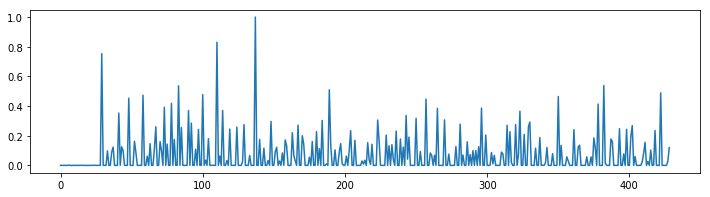

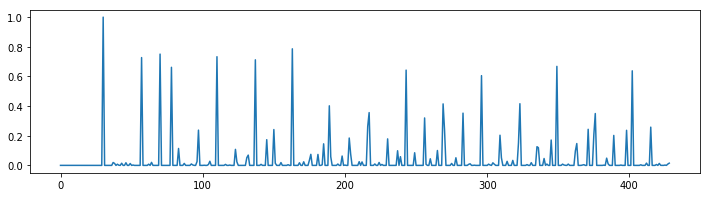

In [94]:
fft_len, hop_size, gamma = 1024, 512, 100
low_nov = subband_novelty(snd, fft_len, hop_size, gamma, fs, 0, 250)
high_nov = subband_novelty(snd, fft_len, hop_size, gamma, fs, 4000, 8000)

plt.figure()
plt.plot(low_nov)
plt.figure()
plt.plot(high_nov)

## Exercise 6c

Describe your observations of the above experiment based on listening to the audio and observing the plots.

Answer:
Since the first spectrogram is only one k value, it is much more variable (noisy) than the second.
This causes noise in the first spectrogram because 
 1. Small changes in value will show up as large with respect to the sum over all k values 
 2. There should be a large amount of uncertainty in the low frequency energy when taken over a small slice in time domain


## Exercise 7

Replicate the Dynamic Programming for Beat Detection algorithm on the following "toy" problem.

The novelty function $\Delta(n) = [2,1,7,3,0,3,0,4,1,5,2]$.  
The estimated beat period $\hat \delta = 4$  
The penalty function $P_{\hat \delta}(\delta) = - (\delta - \hat \delta)^2$  
The adjustment constant  $\lambda = 1$  

- Compute the accumulated score vector $\mathbf{D}(n)$.
- As you do that, create the backtracking vector $\mathbf{P}(n)$.
- Finally, follow the pointers of $\mathbf{P}(n)$ from $n = \text{argmax}(\mathbf{P}(n))$ to $n=0$ to create the list of beat locations. 


In [153]:
nov = [2,1,7,3,0,3,0,4,1,5,2]
nov2 = [1,3,0,0,2,1,4,0,0,2]
dhat, l  = 4, 1
dhat2 = 3

def backtrack(curr_index, lst, P): 
    return backtrack(P[curr_index], [curr_index] + lst, P) if curr_index != 0 else lst  

def getPath(nov, dhat, l):
    nov_dict = {i+1:val for (i,val) in enumerate(nov)}
    D = {0:0} #D[n] stores the score of the best beat seq score ending at n
    P = {} 
    P_dhat = lambda d: -(d-dhat)**2
    for i in range(1, len(nov)+1): #D[0] already filled
        P[i], D[i] = max(enumerate([D[m]+l*P_dhat(i-m) for m in range(0,i)]), 
                         key=lambda p:p[1])
        D[i] = nov_dict[i] + max(0,D[i])
    max_score_index = max(D, key=lambda k:D[k])
    beats = backtrack(max_score_index, [], P)
    return beats
    
print getPath(nov,dhat,l)
#getPath(nov2,dhat2,l)

[3, 6, 10]


## Exercise 8

One of the inputs to the dynamic programming algorithm is an estimated tempo (or rather, an estimated _beat period_) for the whole song. 

Write the function `find_beat_period()` that estimates the beat period given the novelty function $\Delta(n)$ using an autocorrelation tempogram approach.

Inputs:  
- `nov`: the novelty function $\Delta(n)$
- `ff`: $F_f$, the sampling rate of nov
- `bpm_low`, `bpm_high`: tempo constraints in beats-per-minute

Output:  
- beat period (as an integer)

Strategy:
- Create an autocorrelation tempogram. You may use `fmp.make_ac_tempogram()`.
- Find the average autocorrelation vector for the whole song.
- Find the max value of this average autocorrelation vector (ie, the lag value), but making sure that the tempo it represents falls within the low and high BPM constraints.
- Use this lag value to compute the _beat period_ in units of samples, assuming a sampling rate of $F_f$ (the rate of $\Delta(n)$).


In [210]:
def index_to_bpm(i, ff):
    #peak at i means that self-similar when shifted by i
    #so different peak i's will correspond to different mults of the beat
    #if the song is i-periodic (i hops/period) * (1 period / 1 beat) * Ff samples/hop * 1/Fs seconds/sample 
    return (ff*60.0) / float(i)
    
def bpm_to_index(bpm, ff):
    return (ff*60)/float(bpm)
    
def find_beat_period(nov, ff, bpm_low, bpm_high):
    tg = fmp.make_ac_tempogram(nov, tg_win_len, tg_hop_size)
    ave_tg = np.mean(tg, axis = 1)
    plt.plot(ave_tg)
    i_high, i_low = map(lambda bpm:bpm_to_index(bpm, ff), [bpm_low, bpm_high])
    #print i_low, i_high
    ave_tg_cpy = ave_tg.copy()
    ave_tg_cpy[:int(i_low)+1] = 0
    ave_tg_cpy[int(i_high):] = 0
    plt.plot(ave_tg_cpy)
    return np.argmax(ave_tg_cpy,0)
    

Test your function using the audio below with BPM constraints $[40, 160]$

26


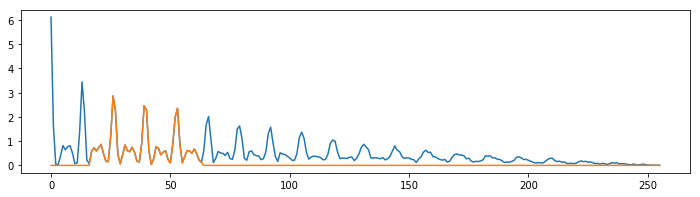

In [211]:
snd = load_wav("audio/wonder_superstition.wav", 0, 30)
fs = 22050.
fft_len = 2048
hop_size = 512
nov = fmp.spectral_novelty(snd, fft_len, hop_size, 10)
ipd.Audio(snd, rate=fs)

# find and print the estimated beat period...
per = find_beat_period(nov, f_nov, 40, 160)
print per

## Exercise 9

Now that you have an estimated period (which should be $26$), use it as a parameter to the dynamic beat tracking function below.

In [220]:
est_period = 26
beats = fmp.create_dp_beats(nov, est_period, lmda = 5.)
listen_to_clicks(beats * hop_size, snd * .5)

Notice how the click track starts fine, but then latches onto the offbeat. The problem is that there is a very strong offbeat hit on the high hat. To counteract this effect, we can use the `subband_novelty()` function from Exercise 7 to create a novelty function with higher emphasis on the bass.

Create a novelty function that is a weighted sum of two band-limited novelty functions:
- $\Delta_1(n)$ with a frequency range of $0:250$Hz
- $\Delta_2(n)$ with a frequency range of $4000:8000$Hz
- $\Delta(n) = a \cdot \Delta_1(n) + (1-a) \cdot \Delta_2(n) $ where $a \in [0,1]$.

Test out this composite novelty function with different values of $a$. 

What kind of behaviors do you see with different values of $a$?

0 1
29 59


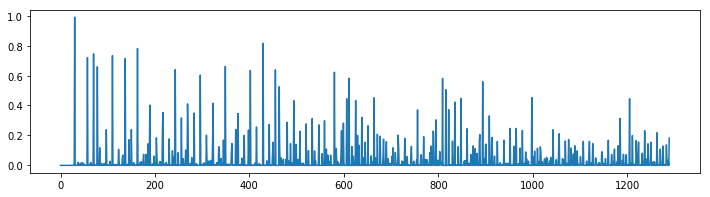

In [233]:
fft_len, hop_size, gamma = 1024, 512, 100
low_nov = subband_novelty(snd, fft_len, hop_size, gamma, fs, 0, 250)
high_nov = subband_novelty(snd, fft_len, hop_size, gamma, fs, 4000, 8000)
mix_nov = lambda a: a*low_nov + (1-a)*high_nov

#@interact(a=(0,100))
#def test_composite_novelty(a):
#    plt.plot(mix_nov(a/100.0))
#    plt.show()

a = 0.01
est_period = 26
m_nov = mix_nov(a)
plt.plot(m_nov)
plt.show()

beats = fmp.create_dp_beats(m_nov, est_period, lmda = 5.)
listen_to_clicks(beats * hop_size, snd * .5)
    

Answer:
The click track stays on the main beat for difference values of a.